In [1]:
import librosa
from IPython.display import Audio
import numpy as np
from matplotlib import pyplot as plt
from librosa.util import fix_length
import warnings
import os
import pandas as pd
import seaborn as sns
from pqdm.processes import pqdm
from typing import List
from librosa import cqt
from librosa.feature import mfcc, spectral_centroid, spectral_rolloff, zero_crossing_rate, chroma_stft, delta, melspectrogram
from librosa.display import waveshow
import pickle
from scipy.stats import skew, kurtosis
plt.rcParams["figure.figsize"] = (20,5)

In [8]:
song, sample_rate = librosa.load('data/test.mp3', mono=True)

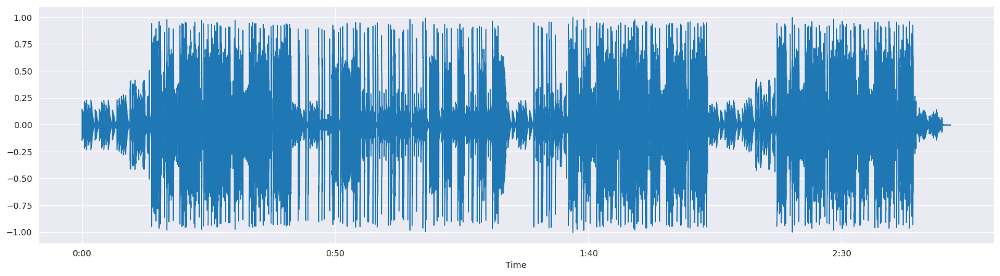

In [10]:
waveshow(song)

In [11]:
Audio(data = song, rate = sample_rate)

In [6]:
sample_rate

22050

Тип

In [7]:
song.dtype

dtype('float32')

In [8]:
bpm, beats = librosa.beat.beat_track(y=song)

In [9]:
bpm

143.5546875

Длина песни в секундах

In [10]:
(song.shape[0] / sample_rate)

171.45106575963717

In [11]:
22050 / 44

501.1363636363636

In [12]:
# Класс, для загрузки и препроцессинга аудио
class AudioPreprocessor:
    def __init__(self, path: str, sample_rate = 22050, preserve_sec = 15, shift_sec = 5):
        # Загружаем аудиозапись, указываем схлопывание стерео в моно и down/upsampling до sample_rate
        song, _ = librosa.load(path, mono=True, sr = sample_rate, res_type="kaiser_best", offset = shift_sec, duration = preserve_sec)

        # Если аудио меньше чем shift_sec + preserve_sec по длительности - делаем паддинг и печатаем ворнинг
        desired_sample_num = int(sample_rate * preserve_sec)
        pad_by = desired_sample_num - song.shape[0]

        # Если не хватает больше 10% - выбрасываем ошибку. Нужно отбросить такое аудио
        if pad_by > desired_sample_num / 10 :
            raise Exception(f'Song duration is {song.shape[0] / sample_rate} that is more than 10 times smaller than {preserve_sec}')

        if pad_by != 0:
            warnings.warn(f'Padding audio {path} by {pad_by} samples')
            song = fix_length(song, size=desired_sample_num)

        self.duration = preserve_sec
        self.path = path
        self.sample_rate = sample_rate
        self.song = song


In [13]:
class Extractor:
    def execute(self, audio: AudioPreprocessor, hop_size: int, win_length: int):
        return None

class MFCCExtractor(Extractor):
    def __init__(self, n_mfcc):
        self.n_mfcc = n_mfcc

    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        mfcc_features = mfcc(
            y = audio.song,
            sr = audio.sample_rate,
            n_mfcc=self.n_mfcc,
            hop_length= hop_size,
            win_length = window_size
        )

        return mfcc_features.T

class MFCCDeltaExtractor(Extractor):
    def __init__(self, n_mfcc, order):
        self.n_mfcc = n_mfcc
        self.order = order

    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        mfcc_features = mfcc(
            y = audio.song,
            sr = audio.sample_rate,
            n_mfcc=self.n_mfcc,
            hop_length= hop_size,
            win_length = window_size
        )

        return delta(mfcc_features, order=self.order).T

class SpectralCentroidExtractor(Extractor):
    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        spectral_centroid_features = spectral_centroid(
            y = audio.song,
            sr = audio.sample_rate,
            hop_length= hop_size,
            win_length = window_size
        )

        return spectral_centroid_features.T

class SpectralRoloffExtractor(Extractor):
    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        spectral_rolloff_features = spectral_rolloff(
            y = audio.song,
            sr = audio.sample_rate,
            hop_length= hop_size,
            win_length = window_size
        )

        return spectral_rolloff_features.T

class ZCRExtractor(Extractor):
    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        zcr_features = zero_crossing_rate(
            y = audio.song,
            hop_length= hop_size,
        )

        return zcr_features.T

class ChromaExtractor(Extractor):
    def __init__(self, n_chroma: int):
        self.n_chroma = n_chroma

    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        chroma_features = chroma_stft(
            n_chroma = self.n_chroma,
            y = audio.song,
            sr = audio.sample_rate,
            hop_length= hop_size,
            win_length = window_size
        )

        return chroma_features.T

class MelgramExtractor(Extractor):
    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        mel_spec = melspectrogram(
            y = audio.song,
            sr = audio.sample_rate,
            hop_length= hop_size,
            win_length = window_size
        )

        return mel_spec.T

class QTransformationExtractor(Extractor):
    def execute(self, audio: AudioPreprocessor, hop_size: int, window_size: int):
        cqt_spec = cqt(
            y = audio.song,
            sr = audio.sample_rate,
            hop_length= hop_size
        )

        return cqt_spec.T

In [14]:
# Сжать 2d фичи в 1 вектор (mean, std, kurtosis, skewness каждой фичи)
def feature_flattener(features: np.ndarray):
    stacked =  np.vstack((
        np.mean(features, axis = 0),
        np.std(features, axis=0),
        skew(features, axis=0),
        kurtosis(features, axis=0))
    )
    # Если kurtosis или skewness дают nan из-за 0 std - заменяем нулями
    stacked[np.isnan(stacked)] = 0.0

    return stacked.flatten()

# Класс, формирующий фичи аудиозаписи
class FeatureExtractor:
    def __init__(self,
                 audio: AudioPreprocessor,
                 extractors: List[Extractor],
                 window_size_ms: int,
                 hop_size_ms: int,
                 flatten_features: bool,
                 ):
        self.audio = audio

        # Размер окна в кол-ве семплов
        self.window_size = int(window_size_ms * 0.001 * sample_rate)
        # Шаг в кол-ве семплов
        self.hop_size = int(hop_size_ms * 0.001 * sample_rate)

        self.extractors = extractors
        self.flatten_features = flatten_features

    def get_features(self):
        features = []
        for extractor in self.extractors:
            feature = extractor.execute(self.audio, self.hop_size, self.window_size)
            features.append(feature)

        resulting_features = np.hstack(features)
        return resulting_features if self.flatten_features is False else feature_flattener(resulting_features)

In [15]:
# Класс, сохраняющий метаданные
def get_id_from_filename(filename: str) -> str:
    return filename.split('.')[0].lstrip('0')


class MetadataDumper:
    def __init__(self,
                 in_dir_path: str,
                 out_path: str,
                 kwargs_for_preprocessor: dict = None,
                 kwargs_for_extractor: dict = None,
                 filter_ids: List[int] = None,
                 ):
        if kwargs_for_extractor is None:
            kwargs_for_extractor = {}
        if kwargs_for_preprocessor is None:
            kwargs_for_preprocessor = {}

        self.kwargs_for_extractor = kwargs_for_extractor
        self.kwargs_for_preprocessor = kwargs_for_preprocessor

        self.in_dir_path = in_dir_path
        self.out_path = out_path
        self.filter_ids = filter_ids

    def func(self, args):
        path, name = args
        full_path = os.path.join(path, name)
        id = get_id_from_filename(name)
        audio = AudioPreprocessor(full_path, **self.kwargs_for_preprocessor)

        extractor = FeatureExtractor(audio, **self.kwargs_for_extractor)
        features = extractor.get_features()

        return id, features

    def execute(self, n_jobs = 4, n_files: int = None):

        paths = [(path, name) for path, subdirs, files in os.walk(self.in_dir_path) for name in files]
        if self.filter_ids is not None:
            paths = list(filter(lambda x: int(get_id_from_filename(x[1])) in self.filter_ids, paths))

        if n_files is not None:
            paths = paths[:n_files]

        rows_of_pairs = pqdm(paths, self.func, n_jobs)
        # Иногда могут возникать ошибки на битых аудио. Отбросим такие аудио
        rows_of_pairs = [val for val in rows_of_pairs if isinstance(val, tuple)]

        print(f'После преобразования {len(paths)} осталось {len(rows_of_pairs)} аудио. Ошибок {len(paths) - len(rows_of_pairs)}')
        pickle.dump(dict(rows_of_pairs), open(self.out_path, 'wb'))

Чтобы не делать лишних вычислений, возьмем только нужные id

In [16]:
filter_ids = pd.read_csv('genre_classification_metadata.csv')['track_id'].to_list()
len(filter_ids)

13736

In [17]:
paths = [(path, name) for path, subdirs, files in os.walk('data/fma_large') for name in files]
paths = list(filter(lambda x: int(get_id_from_filename(x[1])) in filter_ids, paths))
len(paths)

13456

Некоторые треки отсутствуют в датасете

In [55]:
mfcc_extractor = MFCCExtractor(24)
zcr_extractor = ZCRExtractor()
spectral_roloff_extractor = SpectralRoloffExtractor()
spectral_centroid_extractor = SpectralCentroidExtractor()
chroma_extractor = ChromaExtractor(12)

extractor = FeatureExtractor(
    AudioPreprocessor('data/test.mp3', preserve_sec=20, shift_sec=1),
    extractors = [mfcc_extractor, zcr_extractor, spectral_centroid_extractor, spectral_roloff_extractor, chroma_extractor],
    window_size_ms = 40,
    hop_size_ms=20,
    flatten_features=False
)

features = extractor.get_features()
features

array([[-2.68261963e+02,  1.33665024e+02,  9.20775795e+00, ...,
         6.48493588e-01,  2.00058460e-01,  4.63595949e-02],
       [-4.73650543e+02,  8.13652496e+01,  5.90474854e+01, ...,
         4.58828092e-01,  3.32762487e-02,  2.14173808e-03],
       [-4.75629761e+02,  7.89045715e+01,  5.74647293e+01, ...,
         4.74669784e-01,  3.65428180e-02,  3.07300431e-03],
       ...,
       [-2.36031586e+02,  9.15770569e+01,  5.86077156e+01, ...,
         5.81729770e-01,  5.43247223e-01,  5.08822560e-01],
       [-2.45396545e+02,  9.97606049e+01,  6.82114258e+01, ...,
         6.02864027e-01,  5.77211201e-01,  5.88128090e-01],
       [-1.27499329e+02,  1.06532089e+02,  2.66143417e+01, ...,
         6.86738491e-01,  6.20894730e-01,  5.84668040e-01]])

## 2D фичи

In [ ]:
MetadataDumper(
    'data/fma_large',
    'features/mfcc12.p',
    filter_ids = filter_ids,
    kwargs_for_preprocessor={
        'preserve_sec': 20,
        'shift_sec': 1
    },
    kwargs_for_extractor={
        'window_size_ms': 40,
        'hop_size_ms': 20,
        'extractors': [MFCCExtractor(12)],
        "flatten_features": False,
    }).execute(n_jobs=64, n_files=None)

MetadataDumper(
    'data/fma_large',
    'features/mfcc24.p',
    filter_ids = filter_ids,
    kwargs_for_preprocessor={
        'preserve_sec': 20,
        'shift_sec': 1
    },
    kwargs_for_extractor={
        'window_size_ms': 40,
        'hop_size_ms': 20,
        'extractors': [MFCCExtractor(24)],
        "flatten_features": False,
    }).execute(n_jobs=64, n_files=None)

MetadataDumper(
    'data/fma_large',
    'features/mfcc32.p',
    filter_ids = filter_ids,
    kwargs_for_preprocessor={
        'preserve_sec': 20,
        'shift_sec': 1
    },
    kwargs_for_extractor={
        'window_size_ms': 40,
        'hop_size_ms': 20,
        'extractors': [MFCCExtractor(32)],
        "flatten_features": False,
    }).execute(n_jobs=64, n_files=None)

QUEUEING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
[src/libmpg123/layer3.c:INT123_do_layer3():1804] error: dequantization failed!
[src/libmpg123/layer3.c:INT123_do_layer3():1774] error: part2_3_length (1760) too large for available bit count (1568)
Note: Illegal Audio-MPEG-Header 0x63ffe064 at offset 3010.
Note: Trying to resync...
Note: Skipped 844 bytes in input.
Note: Illegal Audio-MPEG-Header 0xaff955e1 at offset 3858.
Note: Trying to resync...
Note: Skipped 196 bytes in input.
Note: Illegal Audio-

In [56]:
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc24-zcr-sc-sr-chr.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [mfcc_extractor, zcr_extractor, spectral_centroid_extractor, spectral_roloff_extractor, chroma_extractor],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)

QUEUEING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/110/110339.mp3 by 804 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/050/050920.mp3 by 13194 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/058/058808.mp3 by 10890 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] 

COLLECTING RESULTS | :   0%|          | 0/13456 [00:00<?, ?it/s]

После преобразования 13456 осталось 13289 аудио. Ошибок 167


In [ ]:
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta12.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(12, 1)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)
#
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta24.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(24, 1)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)
#
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta32.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(32, 1)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)

In [ ]:
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta_delta12.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(12, 2)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)
#
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta_delta24.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(24, 2)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)
#
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc_delta_delta32.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MFCCDeltaExtractor(32, 2)],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)

# Спектрограмма и constant-Q преобразование

(1001, 128)


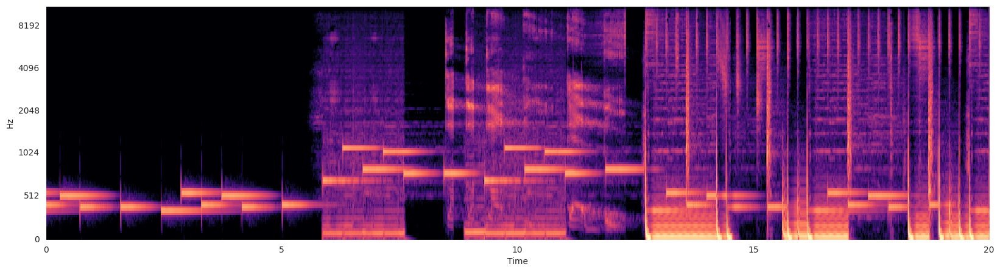

In [50]:
extractor = FeatureExtractor(
    AudioPreprocessor('data/test.mp3', shift_sec=1, preserve_sec=20),
    extractors = [MelgramExtractor()],
    window_size_ms = 40,
    hop_size_ms=20,
    flatten_features=False,
)

features = extractor.get_features()
print(features.shape)
librosa.display.specshow(
    librosa.power_to_db(features.T, ref=np.max),
    sr=22050,
    x_axis='time',
    y_axis='mel',
    hop_length=extractor.hop_size,
    win_length=extractor.window_size
)

(1001, 84)


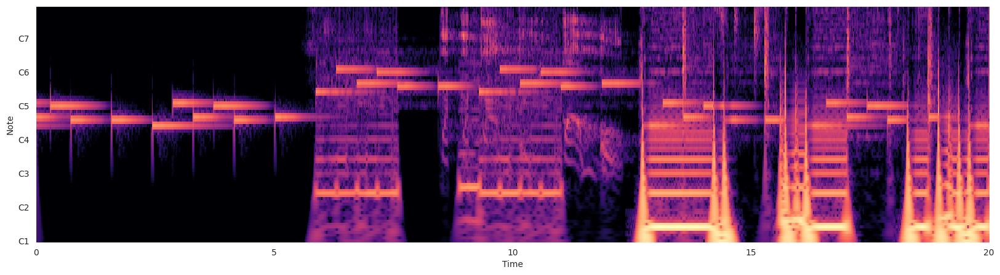

In [51]:
extractor = FeatureExtractor(
    AudioPreprocessor('data/test.mp3', shift_sec=1,  preserve_sec=20),
    extractors = [QTransformationExtractor()],
    window_size_ms = 40,
    hop_size_ms=20,
    flatten_features=False,
)

features = extractor.get_features()
print(features.shape)
librosa.display.specshow(
    librosa.amplitude_to_db(features.T, ref=np.max),
    sr=22050,
    x_axis='time',
    y_axis='cqt_note',
    hop_length=extractor.hop_size,
    win_length=extractor.window_size
)

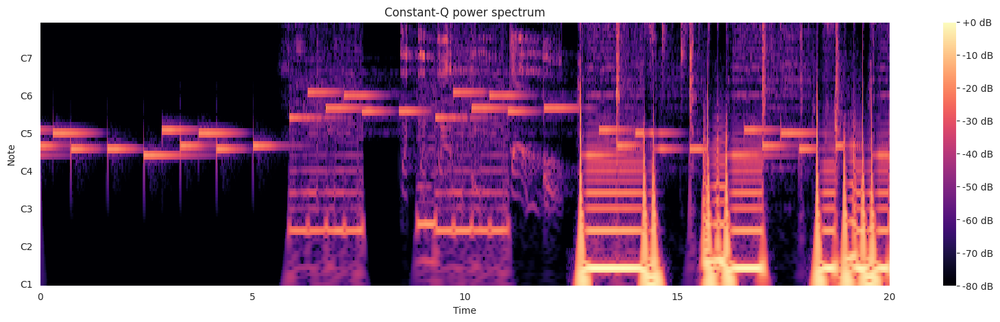

In [52]:
y, sr = librosa.load('data/test.mp3', offset=1, duration=20)

C = np.abs(librosa.cqt(y, sr=sr))

fig, ax = plt.subplots()

img = librosa.display.specshow(librosa.amplitude_to_db(C, ref=np.max),
                               sr=sr, x_axis='time', y_axis='cqt_note', ax=ax)

ax.set_title('Constant-Q power spectrum')

fig.colorbar(img, ax=ax, format="%+2.0f dB")

In [53]:
# MetadataDumper(
#     'data/fma_large',
#     'features/melgram.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [MelgramExtractor()],
#         "flatten_features": False,
#     }).execute(n_jobs=64, n_files=None)

QUEUEING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/110/110339.mp3 by 804 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/050/050920.mp3 by 13194 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/058/058808.mp3 by 10890 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] 

COLLECTING RESULTS | :   0%|          | 0/13456 [00:00<?, ?it/s]

После преобразования 13456 осталось 13289 аудио. Ошибок 167


In [ ]:
MetadataDumper(
    'data/fma_large',
    'features/q-transform.p',
    filter_ids = filter_ids,
    kwargs_for_preprocessor={
        'preserve_sec': 20,
        'shift_sec': 1
    },
    kwargs_for_extractor={
        'window_size_ms': 40,
        'hop_size_ms': 20,
        'extractors': [QTransformationExtractor()],
        "flatten_features": False,
    }).execute(n_jobs=64, n_files=None)

# 1d фичи

In [57]:
# MetadataDumper(
#     'data/fma_large',
#     'features/mfcc24-zcr-sc-sr-chr-flattened.p',
#     filter_ids = filter_ids,
#     kwargs_for_preprocessor={
#         'preserve_sec': 20,
#         'shift_sec': 1
#     },
#     kwargs_for_extractor={
#         'window_size_ms': 40,
#         'hop_size_ms': 20,
#         'extractors': [mfcc_extractor, zcr_extractor, spectral_centroid_extractor, spectral_roloff_extractor, chroma_extractor],
#         "flatten_features": True,
#     }).execute(n_jobs=64, n_files=None)

QUEUEING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/110/110339.mp3 by 804 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/050/050920.mp3 by 13194 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/tmp/ipykernel_78066/670805750.py:16: UserWarning: Padding audio data/fma_large/058/058808.mp3 by 10890 samples
  warnings.warn(f'Padding audio {path} by {pad_by} samples')
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] 

COLLECTING RESULTS | :   0%|          | 0/13456 [00:00<?, ?it/s]

После преобразования 13456 осталось 13289 аудио. Ошибок 167


# 3d Фичи

In [20]:
MetadataDumper(
    'data/fma_large',
    'features/mfcc24-3d-delta.p',
    filter_ids = filter_ids,
    kwargs_for_preprocessor={
        'preserve_sec': 20,
        'shift_sec': 1
    },
    kwargs_for_extractor={
        'window_size_ms': 40,
        'hop_size_ms': 20,
        'extractors': [MFCCExtractor(24), MFCCDeltaExtractor(24, 1), MFCCDeltaExtractor(24, 2)],
        "flatten_features": False,
    }).execute(n_jobs=64, n_files=None)

QUEUEING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/13456 [00:00<?, ?it/s]

[src/libmpg123/layer3.c:INT123_do_layer3():1804] error: dequantization failed!
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
[src/libmpg123/layer3.c:INT123_do_layer3():1804] error: dequantization failed!
[src/libmpg123/layer3.c:INT123_do_layer3():1804] error: dequantization failed!
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:do_readahead():1099] warning: Cannot read next header, a one-frame stream? Duh...
/home/araxal/.local/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/home/araxal/.local/lib/python3.10/site-packages/lib

COLLECTING RESULTS | :   0%|          | 0/13456 [00:00<?, ?it/s]

После преобразования 13456 осталось 13293 аудио. Ошибок 163
